# mlxops-xai Gradient XAI Methods Demo

This notebook demonstrates all gradient-based XAI (Explainable AI) methods in the `mlxops_xai.gradient` module:

| Method | Description |
|--------|-------------|
| `vanilla_gradient` | Basic gradient saliency map |
| `smooth_grad` | Noise-smoothed gradient |
| `integrated_gradients` | Integrated gradients attribution |
| `guided_back_propagation` | Guided backpropagation |
| `guided_absolute_grad` | Guided absolute grad (variance-weighted) |
| `guided_ig` | Guided integrated gradients |
| `blur_integrated_gradients` | Blur integrated gradients |

We use a pretrained ResNet-50 to compute and visualize saliency maps for an ImageNet image.

## 1. Setup

In [1]:
import torch
import torchvision
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
import urllib.request
import os

from mlxops_xai import (
    vanilla_gradient,
    smooth_grad,
    integrated_gradients,
    guided_back_propagation,
    guided_absolute_grad,
    guided_ig,
    blur_integrated_gradients,
)

if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"Using device: {device}")

Using device: mps


## 2. Load Model and Sample Image

Load a pretrained ResNet-50 from torchvision and download a sample image.

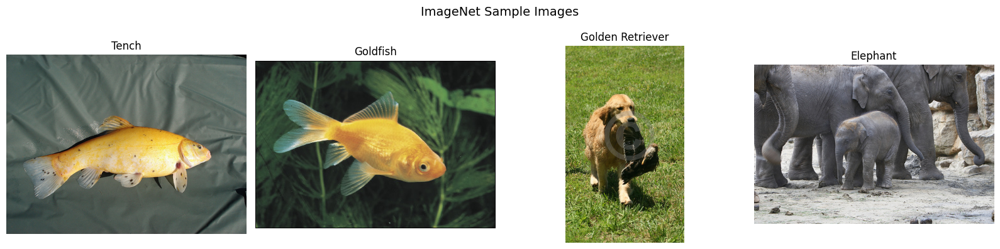

In [2]:
# Load pretrained ResNet-50
model = torchvision.models.resnet50(weights=torchvision.models.ResNet50_Weights.IMAGENET1K_V1)
model = model.to(device)
model.eval()

# ImageNet preprocessing
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Download ImageNet sample images (from EliSchwartz/imagenet-sample-images)
BASE_URL = "https://raw.githubusercontent.com/EliSchwartz/imagenet-sample-images/master/"
SAMPLES = {
    "tench":          ("n01440764_tench.JPEG",          0),    # class 0
    "goldfish":       ("n01443537_goldfish.JPEG",        1),    # class 1
    "golden_retriever": ("n02099601_golden_retriever.JPEG", 207),  # class 207
    "elephant":       ("n02504013_Indian_elephant.JPEG", 385),  # class 385
}

os.makedirs("demo_images", exist_ok=True)
images_pil = {}
for name, (fname, _) in SAMPLES.items():
    path = os.path.join("demo_images", fname)
    if not os.path.exists(path):
        req = urllib.request.Request(BASE_URL + fname, headers={"User-Agent": "Mozilla/5.0"})
        with urllib.request.urlopen(req) as resp, open(path, "wb") as f:
            f.write(resp.read())
    images_pil[name] = Image.open(path).convert("RGB")

# Show all sample images
fig, axes = plt.subplots(1, 4, figsize=(16, 4))
for ax, (name, img_pil) in zip(axes, images_pil.items()):
    ax.imshow(img_pil)
    ax.set_title(name.replace("_", " ").title())
    ax.axis("off")
plt.suptitle("ImageNet Sample Images", fontsize=14)
plt.tight_layout()
plt.show()

In [3]:
# Preprocess all images into a batch and get model predictions
input_tensor = torch.stack([preprocess(img) for img in images_pil.values()]).to(device)
sample_names = list(images_pil.keys())

with torch.no_grad():
    outputs = model(input_tensor)
    pred_classes = outputs.argmax(dim=1)
    probs = torch.softmax(outputs, dim=1).gather(1, pred_classes.unsqueeze(1)).squeeze()

targets = pred_classes
print(f"{'Name':<20} {'Pred class':>10} {'Confidence':>12}")
print("-" * 44)
for name, cls, prob in zip(sample_names, pred_classes.tolist(), probs.tolist()):
    print(f"{name:<20} {cls:>10} {prob:>11.4f}")

Name                 Pred class   Confidence
--------------------------------------------
tench                         0      0.9643
goldfish                      1      0.7991
golden_retriever            207      0.8868
elephant                    385      0.7674


## 3. Visualization Helpers

In [4]:
def show_batch_saliency(saliency_maps, names, title=""):
    """Show saliency maps for a batch: top row = pure heatmap, bottom row = overlay on original image."""
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std  = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    n = len(names)
    fig, axes = plt.subplots(2, n, figsize=(4 * n, 8))
    for c, (name, img_t, sal) in enumerate(zip(names, input_tensor.cpu(), saliency_maps.cpu())):
        img_np = (img_t * std + mean).clamp(0, 1).permute(1, 2, 0).numpy()
        sal_np = sal.squeeze().numpy()
        # Top row: pure saliency heatmap
        axes[0, c].imshow(sal_np, cmap="hot")
        axes[0, c].set_title(name.replace("_", " ").title())
        axes[0, c].axis("off")
        # Bottom row: overlay
        axes[1, c].imshow(img_np)
        axes[1, c].imshow(sal_np, cmap="hot", alpha=0.5)
        axes[1, c].axis("off")
    axes[0, 0].set_ylabel("Saliency Map", fontsize=11)
    axes[1, 0].set_ylabel("Overlay", fontsize=11)
    fig.suptitle(title, fontsize=13)
    plt.tight_layout()
    plt.show()

## 4. Methods Walkthrough

### 4.1 Vanilla Gradient
The simplest saliency method: computes gradients w.r.t. the input, takes the absolute value, and sums across channels.

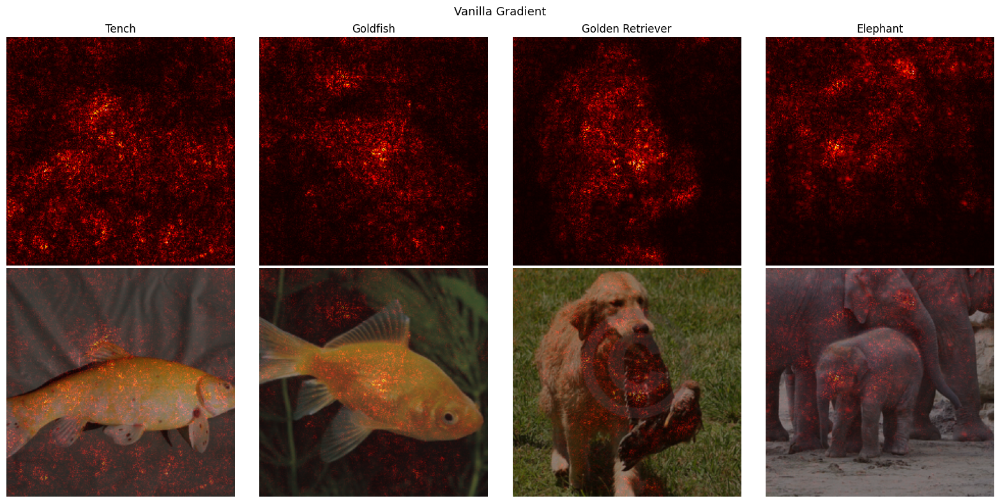

In [5]:
sal_vanilla = vanilla_gradient(model, input_tensor, targets)
show_batch_saliency(sal_vanilla, sample_names, "Vanilla Gradient")

### 4.2 SmoothGrad
Averages gradients over multiple noisy copies of the input to reduce high-frequency noise and produce smoother saliency maps.

Key parameters:
- `num_samples`: number of noise samples (more = smoother but slower)
- `std_spread`: noise std as a fraction of the input value range

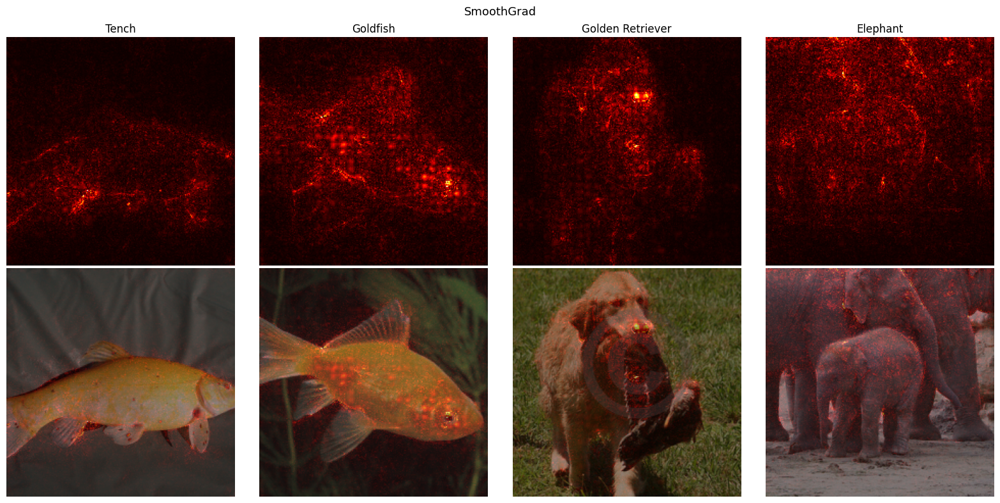

In [6]:
sal_smooth = smooth_grad(model, input_tensor, targets, num_samples=20, std_spread=0.15)
show_batch_saliency(sal_smooth, sample_names, "SmoothGrad")

### 4.3 Integrated Gradients
Integrates gradients along a straight-line path from a baseline (random noise) to the input. Satisfies the completeness and sensitivity axioms.

Key parameters:
- `steps`: number of integration steps
- `trials`: number of random baseline trials
- `direction`: gradient direction filter (`"both"`, `"positive"`, `"negative"`, `"abs"`)
- `aggregation`: multi-trial aggregation (`None`, `"mean"`, `"variance"`, `"guided"`)

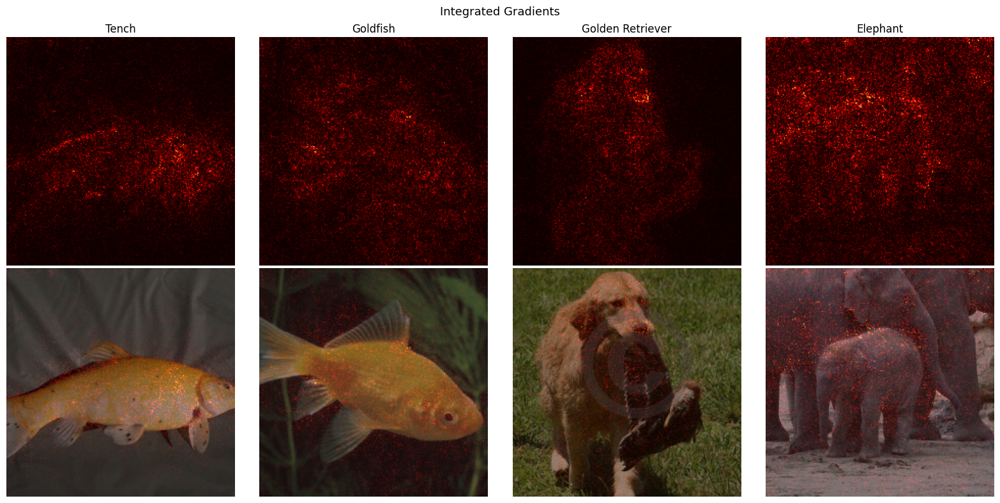

In [7]:
sal_ig = integrated_gradients(model, input_tensor, targets, steps=10, trials=3)
show_batch_saliency(sal_ig, sample_names, "Integrated Gradients")

### 4.4 Guided Backpropagation
Registers backward hooks on ReLU layers to suppress negative gradients during backprop, producing cleaner feature visualizations.

Key parameters:
- `direction`: `"positive"` (standard guided), `"negative"`, `"both"` (degrades to vanilla), `"abs"`
- `iteration`: number of backward passes through the network

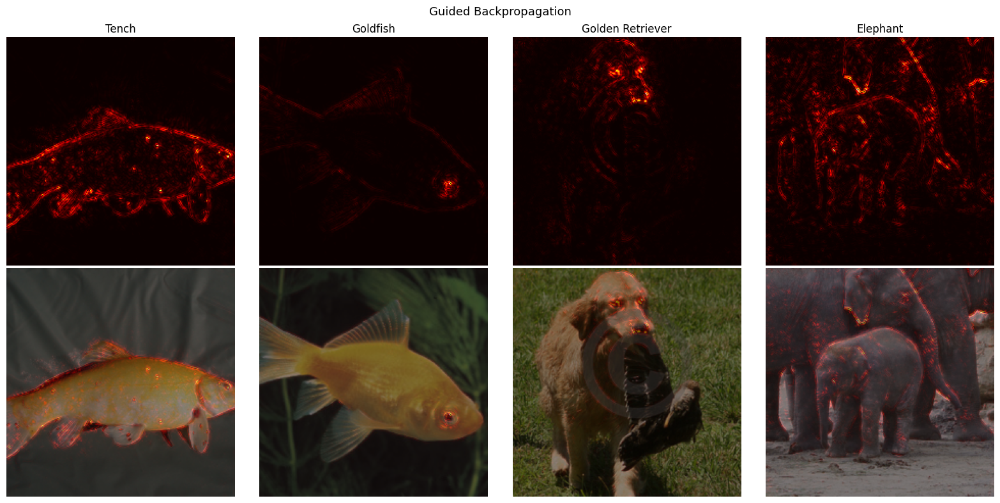

In [8]:
sal_gbp = guided_back_propagation(model, input_tensor, targets, direction="positive")
show_batch_saliency(sal_gbp, sample_names, "Guided Backpropagation")

### 4.5 Guided Absolute Grad
Combines SmoothGrad-style multi-sample noising with variance-weighted aggregation to enhance attribution quality using gradient magnitude.

Key parameters:
- `aggregation`: `"guided"` (variance-weighted + quantile threshold), `"mean"`, `"variance"`
- `th`: quantile threshold for guided aggregation (the `p` parameter in the paper)
- `num_samples`: number of noise samples

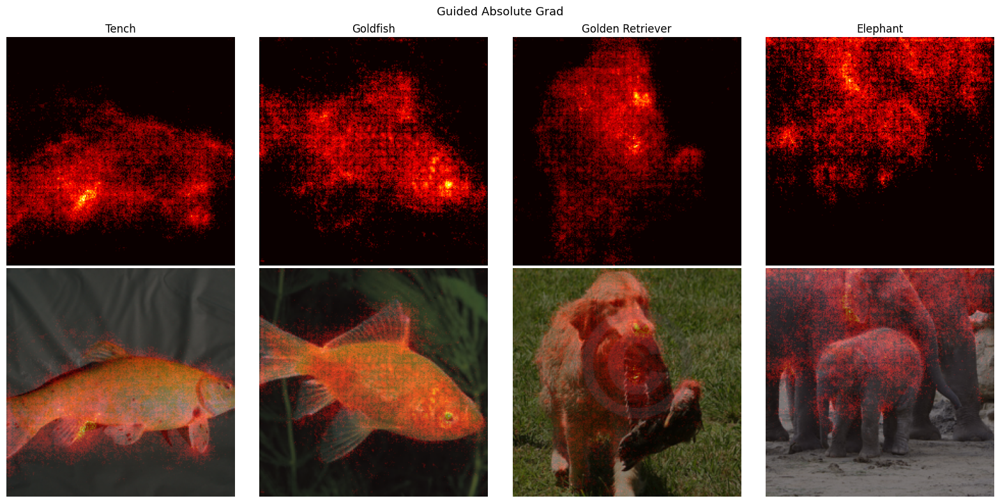

In [9]:
sal_gag = guided_absolute_grad(model, input_tensor, targets, num_samples=10, aggregation="guided", th=0.7)
show_batch_saliency(sal_gag, sample_names, "Guided Absolute Grad")

### 4.6 Guided IG
Advanced method combining Guided Backprop and Integrated Gradients. Uses intelligent feature selection to iteratively optimize the attribution path.

Key parameters:
- `num_samples`: number of integration steps
- `fraction`: quantile fraction of features updated per step
- `max_dist`: maximum alpha deviation from the target along the path

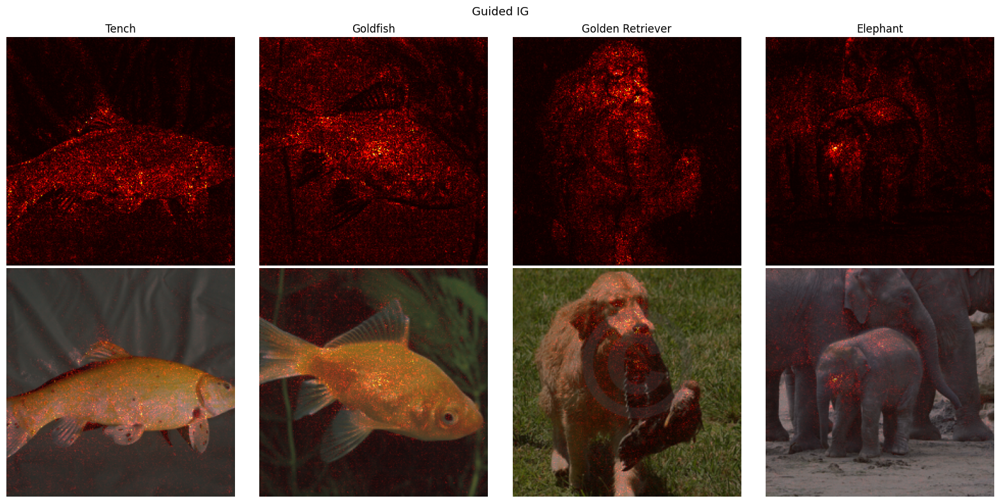

In [10]:
sal_gig = guided_ig(model, input_tensor, targets, num_samples=5, fraction=0.25, max_dist=0.1, aggregation="mean")
show_batch_saliency(sal_gig, sample_names, "Guided IG")

### 4.7 Blur Integrated Gradients
Uses a progressively blurred image (instead of a zero baseline) as the interpolation path, integrating gradients as blur is removed.

Key parameters:
- `num_samples`: number of blur steps
- `max_sigma`: maximum Gaussian blur sigma
- `radius`: Gaussian blur kernel radius
- `grad_step`: finite-difference step size for gradient approximation

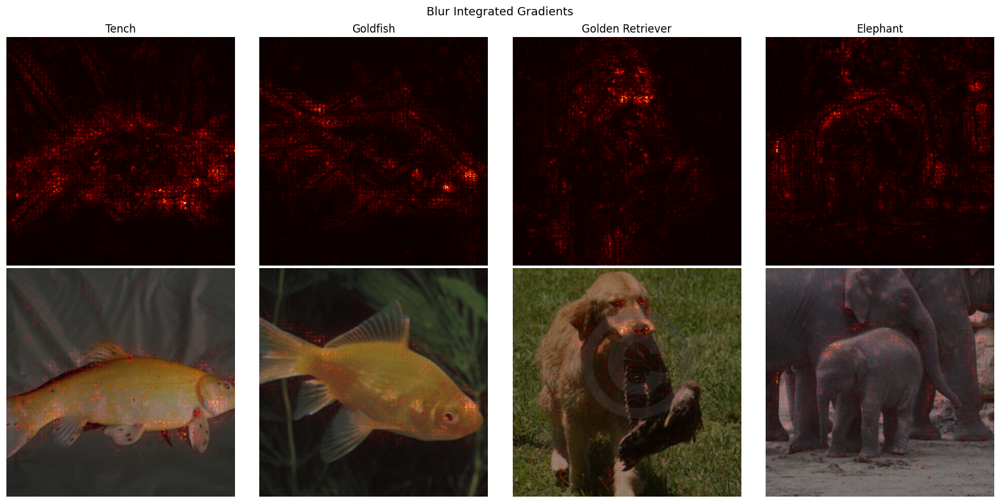

In [11]:
sal_big = blur_integrated_gradients(model, input_tensor, targets, num_samples=20, max_sigma=50, radius=20)
show_batch_saliency(sal_big, sample_names, "Blur Integrated Gradients")

## 5. All Methods at a Glance

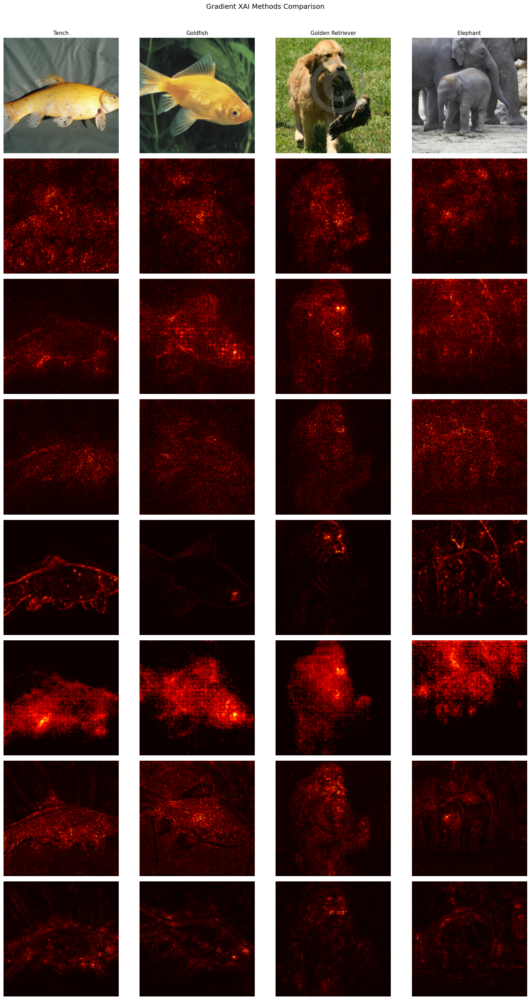

In [12]:
methods = {
    "Vanilla Gradient": sal_vanilla,
    "SmoothGrad":       sal_smooth,
    "Integrated Grad":  sal_ig,
    "Guided Backprop":  sal_gbp,
    "Guided Abs Grad":  sal_gag,
    "Guided IG":        sal_gig,
    "Blur IG":          sal_big,
}

mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
std  = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
n_methods = len(methods)
n_images  = len(sample_names)
n_rows    = 1 + n_methods  # first row = original images

fig, axes = plt.subplots(n_rows, n_images, figsize=(4 * n_images, 3.5 * n_rows))

# Row 0: original images
for c, (name, img_t) in enumerate(zip(sample_names, input_tensor.cpu())):
    img_np = (img_t * std + mean).clamp(0, 1).permute(1, 2, 0).numpy()
    axes[0, c].imshow(img_np)
    axes[0, c].set_title(name.replace("_", " ").title(), fontsize=11)
    axes[0, c].axis("off")
axes[0, 0].set_ylabel("Original", fontsize=11)

# Rows 1+: pure saliency maps per method
for r, (method_name, sals) in enumerate(methods.items(), start=1):
    for c, sal in enumerate(sals.cpu()):
        axes[r, c].imshow(sal.squeeze().numpy(), cmap="hot")
        axes[r, c].axis("off")
    axes[r, 0].set_ylabel(method_name, fontsize=11)

plt.suptitle("Gradient XAI Methods Comparison", fontsize=14, y=1.01)
plt.tight_layout()
plt.show()